In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

folder_path = '/content/drive/My Drive/Malhari_dataset/'
files = os.listdir(folder_path)
print(files)

['cancerous', 'healthy', 'feature_sec_output', 'reduced_features_98var.csv', 'reduced_features_autoencoder.csv', 'reduced_features_autoencoder_with_target.csv', 'reduced_features.csv']


In [ ]:
cancerous_src_folder = "/content/drive/My Drive/Malhari_dataset/cancerous"
healthy_src_folder = "/content/drive/My Drive/Malhari_dataset/healthy"
output_folder = "/content/drive/My Drive/Malhari_dataset/feature_sec_output"


In [ ]:
import os

print(os.path.exists(cancerous_src_folder))  # Should return True
print(os.path.exists(healthy_src_folder))    # Should return True


True
True


Total images found in /content/drive/My Drive/Malhari_dataset/cancerous: 55
Selected images from /content/drive/My Drive/Malhari_dataset/cancerous:
/content/drive/My Drive/Malhari_dataset/cancerous/pap/2 (3).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/pap/3 (1).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/pap/2 (4).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/3 (2).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/5 (2).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/5.jpg
/content/drive/My Drive/Malhari_dataset/cancerous/pap/(4).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/pap/2 (8).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/pap/(7).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/pap/3 (9).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/4 (1).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/pap/3 (8).jpg
/content/drive/My Drive/Malhari_dataset/cancerous/colposcopi

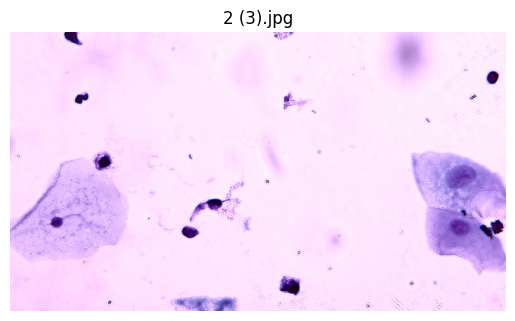

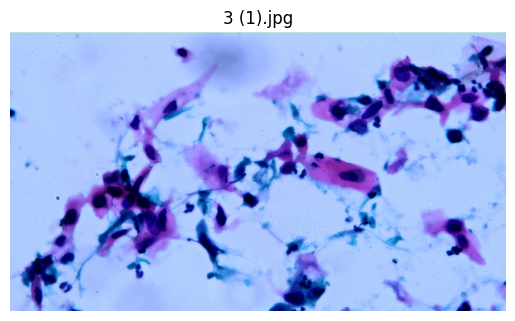

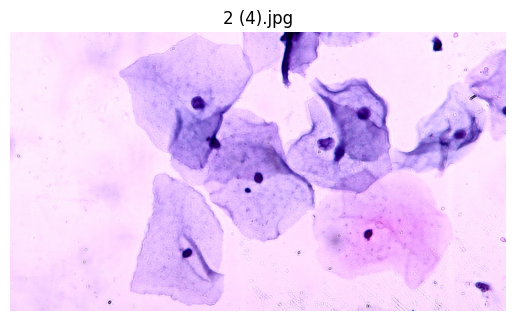

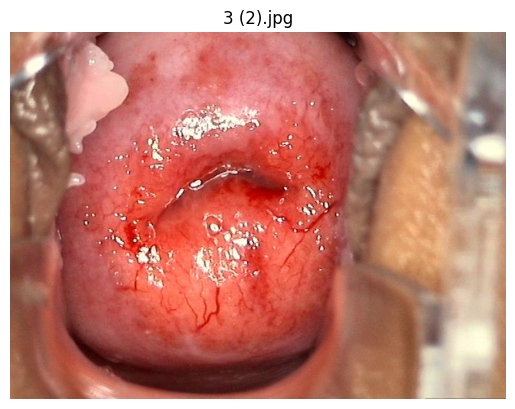

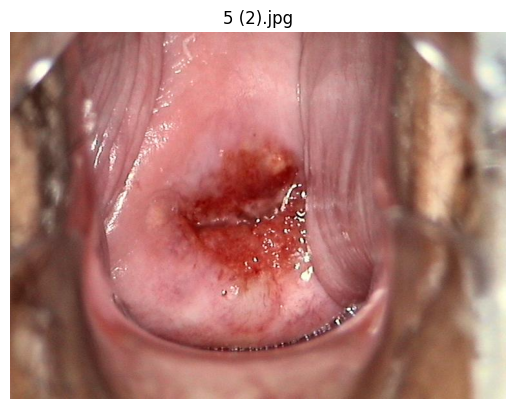

...

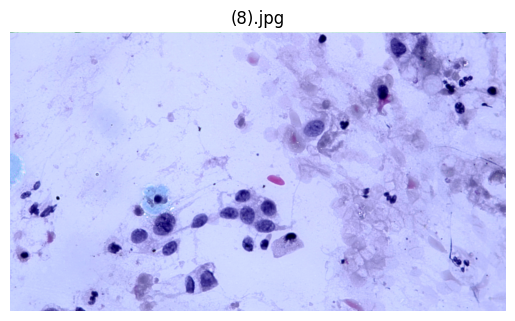

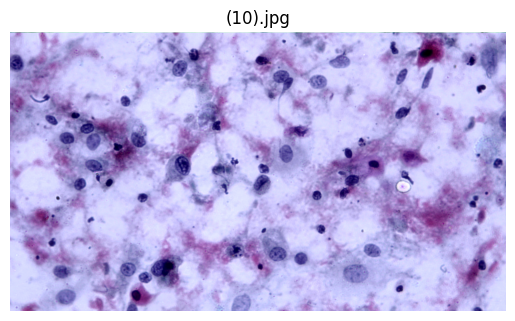

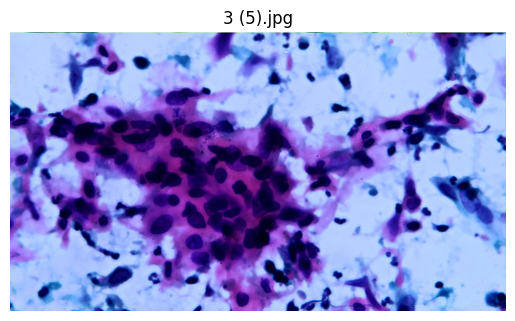

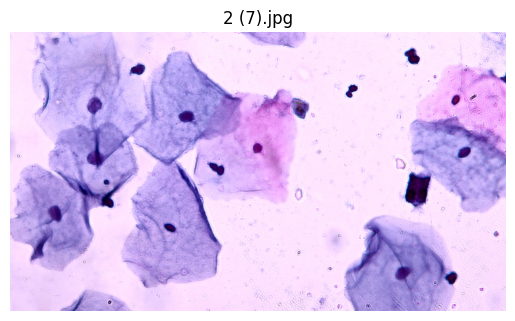

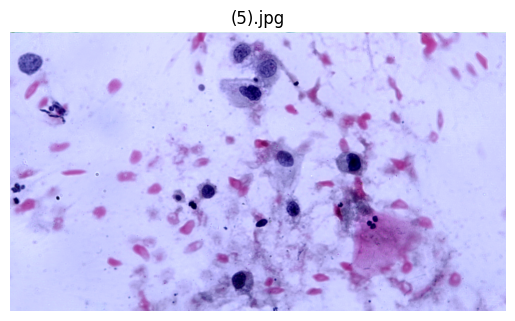

Total images found in /content/drive/My Drive/Malhari_dataset/healthy: 78
Selected images from /content/drive/My Drive/Malhari_dataset/healthy:
/content/drive/My Drive/Malhari_dataset/healthy/pap/13 (10).jpg
/content/drive/My Drive/Malhari_dataset/healthy/pap/3.jpg
/content/drive/My Drive/Malhari_dataset/healthy/pap/14 (10).jpg
/content/drive/My Drive/Malhari_dataset/healthy/pap/14 (9).jpg
/content/drive/My Drive/Malhari_dataset/healthy/pap/14 (1).jpg
/content/drive/My Drive/Malhari_dataset/healthy/pap/12 (10).jpg
/content/drive/My Drive/Malhari_dataset/healthy/colposcopic/3 (2).jpg
/content/drive/My Drive/Malhari_dataset/healthy/pap/13 (9).jpg
/content/drive/My Drive/Malhari_dataset/healthy/pap/6.jpg
/content/drive/My Drive/Malhari_dataset/healthy/colposcopic/7 (4).jpg
/content/drive/My Drive/Malhari_dataset/healthy/colposcopic/7 (3).jpg
/content/drive/My Drive/Malhari_dataset/healthy/pap/13 (6).jpg
/content/drive/My Drive/Malhari_dataset/healthy/colposcopic/3 (3).jpg
/content/drive/M

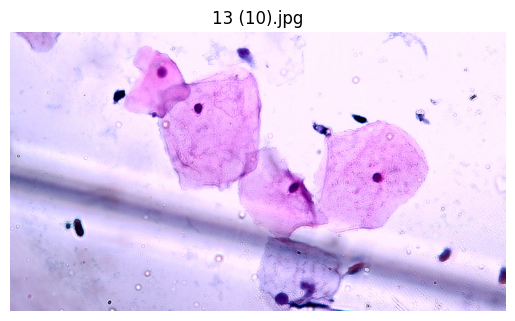

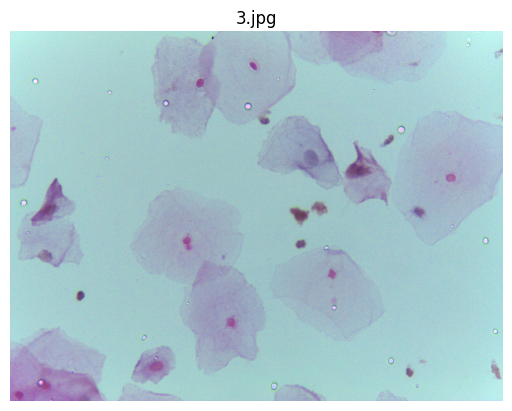

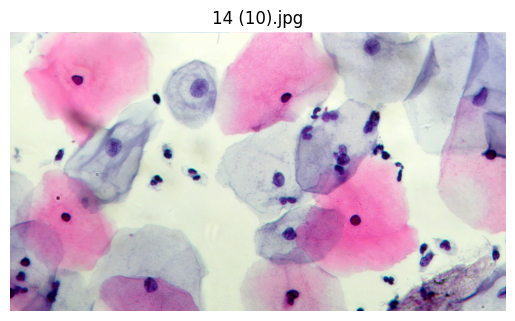

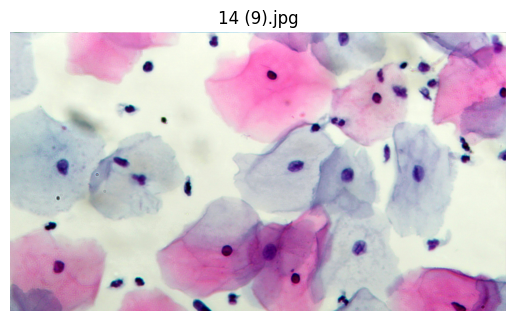

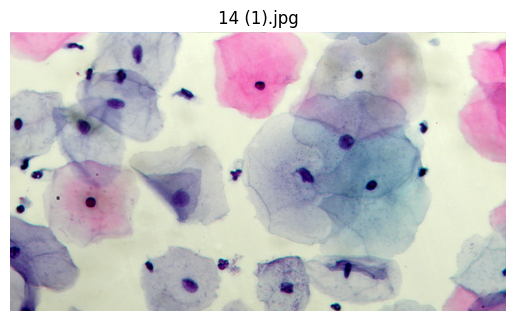

...

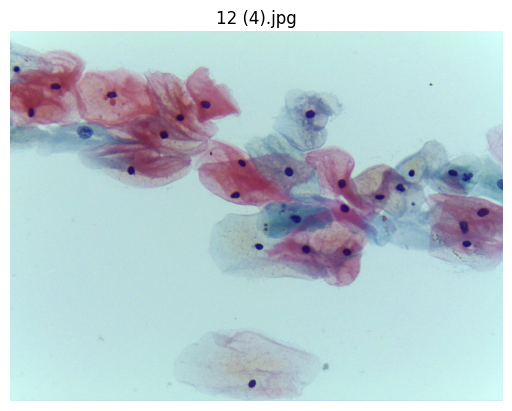

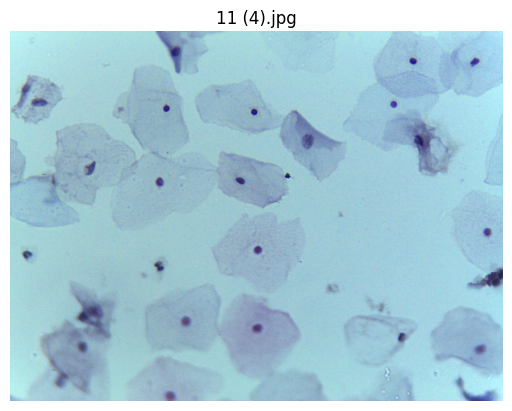

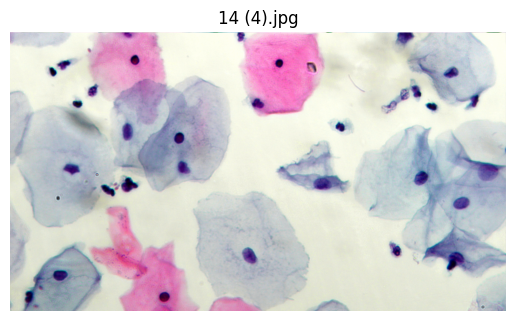

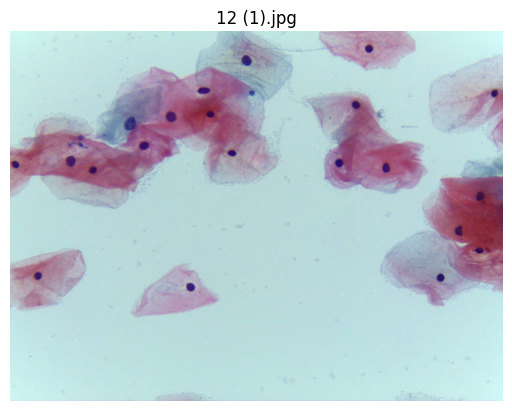

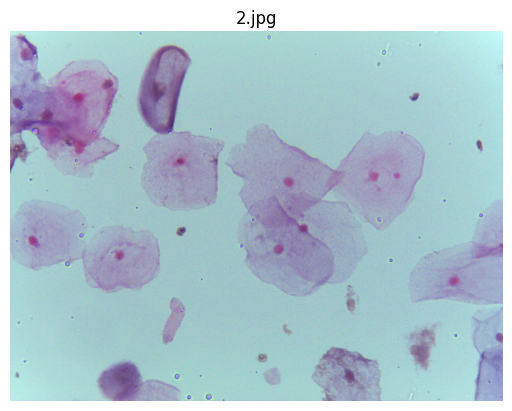

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Function to select 10 random images from subfolders and display them
def select_images_from_subfolders(src_folder, num_images=20):
    image_files = []

    # Traverse all subfolders and collect image paths
    for root, _, files in os.walk(src_folder):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                image_files.append(os.path.join(root, file))

    print(f"Total images found in {src_folder}: {len(image_files)}")

    if not image_files:
        print(f"No images found in {src_folder}.")
        return

    # Randomly select the specified number of images
    selected_images = random.sample(image_files, min(num_images, len(image_files)))
    print(f"Selected images from {src_folder}:")

    # Display selected images
    for img_path in selected_images:
        print(img_path)
        img = Image.open(img_path)
        plt.figure()
        plt.imshow(img)
        plt.axis('off')
        plt.title(os.path.basename(img_path))
    plt.show()

# Define source folders
cancerous_src_folder = "/content/drive/My Drive/Malhari_dataset/cancerous"
healthy_src_folder = "/content/drive/My Drive/Malhari_dataset/healthy"
#output_folder = "/content/drive/My Drive/Malhari_dataset/feature_sec_output"

# Select and display 10 images from each folder
select_images_from_subfolders(cancerous_src_folder)
select_images_from_subfolders(healthy_src_folder)


In [ ]:
import os
import random
from PIL import Image, ImageEnhance, ImageOps, ImageFilter
import matplotlib.pyplot as plt

# Function to perform basic image preprocessing and display results
def preprocess_and_display(img_path):
    img = Image.open(img_path)

    # 1. Original Image
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.title("Original")

    # 2. Convert to Grayscale
    gray_img = ImageOps.grayscale(img)
    plt.figure()
    plt.imshow(gray_img, cmap='gray')
    plt.axis('off')
    plt.title("Grayscale")

    # 3. Enhance Brightness
    bright_img = ImageEnhance.Brightness(img).enhance(1.5)
    plt.figure()
    plt.imshow(bright_img)
    plt.axis('off')
    plt.title("Brightness Enhanced")

    # 4. Enhance Contrast
    contrast_img = ImageEnhance.Contrast(img).enhance(1.5)
    plt.figure()
    plt.imshow(contrast_img)
    plt.axis('off')
    plt.title("Contrast Enhanced")

    # 5. Flip Image Horizontally
    flipped_img = ImageOps.mirror(img)
    plt.figure()
    plt.imshow(flipped_img)
    plt.axis('off')
    plt.title("Horizontally Flipped")

    # 6. Flip Image Vertically
    flipped_vert_img = ImageOps.flip(img)
    plt.figure()
    plt.imshow(flipped_vert_img)
    plt.axis('off')
    plt.title("Vertically Flipped")

    # 7. Apply Edge Detection Filter
    edge_img = img.filter(ImageFilter.FIND_EDGES)
    plt.figure()
    plt.imshow(edge_img, cmap='gray')
    plt.axis('off')
    plt.title("Edge Detection")

    # 8. Apply Gaussian Blur
    blurred_img = img.filter(ImageFilter.GaussianBlur(5))
    plt.figure()
    plt.imshow(blurred_img)
    plt.axis('off')
    plt.title("Gaussian Blur")

    # 9. Add a Border
    bordered_img = ImageOps.expand(img, border=20, fill='black')
    plt.figure()
    plt.imshow(bordered_img)
    plt.axis('off')
    plt.title("Image with Border")

    # 10. Rotate Image
    rotated_img = img.rotate(45)
    plt.figure()
    plt.imshow(rotated_img)
    plt.axis('off')
    plt.title("Rotated Image")

    # Show all processed images
    plt.show()

# Function to select 10 random images from subfolders and preprocess them
def select_and_preprocess_images(src_folder, num_images=10):
    image_files = []

    # Traverse all subfolders and collect image paths
    for root, _, files in os.walk(src_folder):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                image_files.append(os.path.join(root, file))

    print(f"Total images found in {src_folder}: {len(image_files)}")

    if not image_files:
        print(f"No images found in {src_folder}.")
        return

    # Randomly select the specified number of images
    selected_images = random.sample(image_files, min(num_images, len(image_files)))
    print(f"Selected images from {src_folder}:")

    # Preprocess and display selected images
    for img_path in selected_images:
        print(img_path)
        preprocess_and_display(img_path)

cancerous_src_folder = "/content/drive/My Drive/Malhari_dataset/cancerous"
healthy_src_folder = "/content/drive/My Drive/Malhari_dataset/healthy"
# Select, preprocess, and display 10 images from each folder
select_and_preprocess_images(cancerous_src_folder)       # For pap folder
select_and_preprocess_images(healthy_src_folder)  # For colposcopic folder


In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern, hog
from skimage import exposure
import csv

# Function to perform feature extraction and return features
def extract_features(img_path, label):
    img = cv2.imread(img_path)
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 1. Histogram of Oriented Gradients (HOG)
    fd, hog_image = hog(gray_img, orientations=9, pixels_per_cell=(8, 8),
                        cells_per_block=(2, 2), visualize=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # 2. Local Binary Patterns (LBP)
    radius = 3
    n_points = 24 * radius
    lbp = local_binary_pattern(gray_img, n_points, radius, method="uniform")
    lbp_hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), density=True)

    # 3. Scale-Invariant Feature Transform (SIFT)
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(gray_img, None)
    sift_features = des.flatten()[:128] if des is not None else np.zeros(128)

    # 4. Gabor Filters
    gabor_kernels = [
        cv2.getGaborKernel((21, 21), 4.0, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
        for theta in [0, np.pi/4, np.pi/2, 3*np.pi/4]
    ]
    gabor_features = []
    for kernel in gabor_kernels:
        filtered_img = cv2.filter2D(gray_img, cv2.CV_8UC3, kernel)
        gabor_features.extend(filtered_img.mean(axis=(0, 1)).flatten())

    return {
        "Image": img_path,
        "Label": label,
        "HOG": fd,
        "LBP": lbp_hist,
        "SIFT": sift_features,
        "Gabor": gabor_features
    }

# Function to select random images from subfolders and extract features
def select_and_extract_features(src_folder, label, num_images=10):
    image_files = []

    # Traverse all subfolders and collect image paths
    for root, _, files in os.walk(src_folder):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                image_files.append(os.path.join(root, file))

    if not image_files:
        print(f"No images found in {src_folder}.")
        return []

    # Randomly select the specified number of images
    selected_images = random.sample(image_files, min(num_images, len(image_files)))
    print(f"Selected images from {src_folder}: {len(selected_images)} images.")

    all_features = []
    for img_path in selected_images:
        print(f"Processing {img_path}")
        features = extract_features(img_path, label)
        all_features.append(features)

    return all_features

# Function to save combined features to a single CSV file
def save_combined_features_to_csv(features, output_folder, output_file_name):
    # Create the folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Full path for the output CSV file
    output_file = os.path.join(output_folder, output_file_name)

    with open(output_file, mode="w", newline="") as csv_file:
        writer = csv.writer(csv_file)

        # Write the header
        header = ["Image", "Label"] + \
                 [f"HOG_{i}" for i in range(len(features[0]["HOG"]))] + \
                 [f"LBP_{i}" for i in range(len(features[0]["LBP"]))] + \
                 [f"SIFT_{i}" for i in range(len(features[0]["SIFT"]))] + \
                 [f"Gabor_{i}" for i in range(len(features[0]["Gabor"]))]
        writer.writerow(header)

        # Write the feature data
        for feature in features:
            row = [feature["Image"], feature["Label"]] + \
                  feature["HOG"].tolist() + \
                  feature["LBP"].tolist() + \
                  feature["SIFT"].tolist() + \
                  feature["Gabor"]
            writer.writerow(row)

    print(f"Feature extraction completed. Data saved to {output_file}")

# Main script
if __name__ == "__main__":
    # Define source folders
    cancerous_src_folder = "/content/drive/My Drive/Malhari_dataset/cancerous"
    healthy_src_folder = "/content/drive/My Drive/Malhari_dataset/healthy"

    # Define output folder and file
    output_folder = "/content/drive/My Drive/Malhari_dataset/feature_sec_output"
    output_file_name = "combined_features.csv"

    # Extract features for cancerous and healthy images
    cancerous_features = select_and_extract_features(cancerous_src_folder, "cancerous", num_images=20)
    healthy_features = select_and_extract_features(healthy_src_folder, "healthy", num_images=20)

    # Combine both feature sets
    combined_features = cancerous_features + healthy_features

    # Save combined features to CSV
    save_combined_features_to_csv(combined_features, output_folder, output_file_name)


Selected images from /content/drive/My Drive/Malhari_dataset/cancerous: 20 images.
Processing /content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/3 (2).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/pap/(7).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/pap/2 (8).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/pap/(6).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/4 (2).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/1.jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/2 (2).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/pap/(4).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/2 (4).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/pap/3 (10).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/pap/2 (7).jpg
Processing /content/drive/My Drive/Malhari_dataset/cancerous/

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern, hog
from skimage import exposure
import csv

# Function to perform feature extraction and return features
def extract_features(img_path, label):
    img = cv2.imread(img_path)
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 1. Histogram of Oriented Gradients (HOG)
    fd, hog_image = hog(gray_img, orientations=9, pixels_per_cell=(8, 8),
                        cells_per_block=(2, 2), visualize=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # 2. Local Binary Patterns (LBP)
    radius = 3
    n_points = 24 * radius
    lbp = local_binary_pattern(gray_img, n_points, radius, method="uniform")
    lbp_hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), density=True)

    # 3. Scale-Invariant Feature Transform (SIFT)
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(gray_img, None)
    sift_features = des.flatten()[:128] if des is not None else np.zeros(128)

    # 4. Gabor Filters
    gabor_kernels = [
        cv2.getGaborKernel((21, 21), 4.0, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
        for theta in [0, np.pi/4, np.pi/2, 3*np.pi/4]
    ]
    gabor_features = []
    for kernel in gabor_kernels:
        filtered_img = cv2.filter2D(gray_img, cv2.CV_8UC3, kernel)
        gabor_features.extend(filtered_img.mean(axis=(0, 1)).flatten())

    # Print feature counts
    print(f"Features extracted from {img_path}:")
    print(f"HOG Features: {len(fd)}")
    print(f"LBP Features: {len(lbp_hist)}")
    print(f"SIFT Features: {len(sift_features)}")
    print(f"Gabor Features: {len(gabor_features)}")
    print("-" * 50)

    return {
        "Image": img_path,
        "Label": label,
        "HOG": fd,
        "LBP": lbp_hist,
        "SIFT": sift_features,
        "Gabor": gabor_features
    }

# Function to select random images from subfolders and extract features
def select_and_extract_features(src_folder, label, num_images=10):
    image_files = []

    # Traverse all subfolders and collect image paths
    for root, _, files in os.walk(src_folder):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                image_files.append(os.path.join(root, file))

    if not image_files:
        print(f"No images found in {src_folder}.")
        return []

    # Randomly select the specified number of images
    selected_images = random.sample(image_files, min(num_images, len(image_files)))
    print(f"Selected images from {src_folder}: {len(selected_images)} images.")

    all_features = []
    for img_path in selected_images:
        print(f"Processing {img_path}")
        features = extract_features(img_path, label)
        all_features.append(features)

    return all_features

# Function to save extracted feature counts to CSV
def save_feature_counts_to_csv(features, output_folder, output_file_name):
    os.makedirs(output_folder, exist_ok=True)
    output_file = os.path.join(output_folder, output_file_name)

    with open(output_file, mode="w", newline="") as csv_file:
        writer = csv.writer(csv_file)

        # Write header
        writer.writerow(["Image", "Label", "HOG_Count", "LBP_Count", "SIFT_Count", "Gabor_Count"])

        # Write feature counts
        for feature in features:
            writer.writerow([
                feature["Image"], feature["Label"],
                len(feature["HOG"]), len(feature["LBP"]),
                len(feature["SIFT"]), len(feature["Gabor"])
            ])

    print(f"Feature counts saved to {output_file}")

# Main script
if __name__ == "__main__":
    # Define source folders
    cancerous_src_folder = "/content/drive/My Drive/Malhari_dataset/cancerous"
    healthy_src_folder = "/content/drive/My Drive/Malhari_dataset/healthy"

    # Define output folder and file
    output_folder = "/content/drive/My Drive/Malhari_dataset/feature_sec_output"
    output_file_name = "combined_features.csv"
    output_feature_count_file = "feature_counts.csv"

    # Extract features for cancerous and healthy images
    cancerous_features = select_and_extract_features(cancerous_src_folder, "cancerous", num_images=20)
    healthy_features = select_and_extract_features(healthy_src_folder, "healthy", num_images=20)

    # Combine both feature sets
    combined_features = cancerous_features + healthy_features

    # Save feature counts to CSV
    save_feature_counts_to_csv(combined_features, output_folder, output_feature_count_file)


Selected images from /content/drive/My Drive/Malhari_dataset/cancerous: 20 images.
Processing /content/drive/My Drive/Malhari_dataset/cancerous/pap/(5).jpg
Features extracted from /content/drive/My Drive/Malhari_dataset/cancerous/pap/(5).jpg:
HOG Features: 3340656
LBP Features: 74
SIFT Features: 128
Gabor Features: 4
--------------------------------------------------
Processing /content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/3 (5).jpg
Features extracted from /content/drive/My Drive/Malhari_dataset/cancerous/colposcopic/3 (5).jpg:
HOG Features: 239400
LBP Features: 74
SIFT Features: 128
Gabor Features: 4
--------------------------------------------------
Processing /content/drive/My Drive/Malhari_dataset/cancerous/pap/(2).jpg
Features extracted from /content/drive/My Drive/Malhari_dataset/cancerous/pap/(2).jpg:
HOG Features: 3340656
LBP Features: 74
SIFT Features: 128
Gabor Features: 4
--------------------------------------------------
Processing /content/drive/My Drive/Ma

In [ ]:
import pandas as pd

# Define the file path
csv_file_path = "/content/drive/My Drive/Malhari_dataset/feature_sec_output/feature_counts.csv"

# Load the CSV file into a Pandas DataFrame
df = pd.read_csv(csv_file_path)

# Display the DataFrame
print(df)


                                                Image      Label  HOG_Count  \
0   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous    3340656   
1   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous     239400   
2   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous    3340656   
3   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous     239400   
4   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous    3340656   
5   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous    3340656   
6   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous     239400   
7   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous    1152936   
8   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous     158976   
9   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous    1152936   
10  /content/drive/My Drive/Malhari_dataset/cancer...  cancerous     239400   
11  /content/drive/My Drive/Malhari_dataset/cancer..

In [ ]:
import pandas as pd

# Define the file path
csv_file_path = "/content/drive/My Drive/Malhari_dataset/feature_sec_output/feature_counts.csv"

# Load the CSV file into a Pandas DataFrame
df = pd.read_csv(csv_file_path)

# Convert all columns (except the first one) to numeric values
df.iloc[:, 1:] = df.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')

# Sum the total feature counts
total_features = df.iloc[:, 1:].sum().sum()  # Skip the first column and sum all values

print(f"Total number of extracted features: {int(total_features)}")  # Convert to integer for display


Total number of extracted features: 66071732


In [ ]:
import pandas as pd

try:
    df = pd.read_csv(
        '/content/drive/My Drive/Malhari_dataset/feature_sec_output/combined_features.csv',
        engine='python',    # Use Python engine for flexibility
        on_bad_lines='skip', # Skip problematic lines
        encoding='utf-8',    # Adjust encoding if needed
        delimiter=','        # Adjust delimiter if not a comma
    )
    print(df)
except Exception as e:
    print(f"Error: {e}")


                                                Image      Label     HOG_0  \
0   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.241226   
1   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.525269   
2   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.151880   
3   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.139620   
4   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.137207   
5   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.201136   
6   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.172265   
7   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.473141   
8   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.221222   
9   /content/drive/My Drive/Malhari_dataset/cancer...  cancerous  0.263279   
10  /content/drive/My Drive/Malhari_dataset/health...    healthy  0.431385   
11  /content/drive/My Drive/Malhari_dataset/health...    healthy

In [ ]:
df.shape

(15, 239608)

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# # Step 1: Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

# # Step 2: Load your dataset
# file_path = '/content/drive/My Drive/Malhari_dataset/feature_sec_output/combined_features.csv'
# df = pd.read_csv(file_path)

# Step 3: Check the initial shape of the dataset
print("Original shape of dataset:", df.shape)

# Step 4: Drop non-numeric columns
df_numeric = df.select_dtypes(include=[np.number])
print("Shape after dropping non-numeric columns:", df_numeric.shape)

# Step 5: Handle missing values (if any)
df_numeric.fillna(df_numeric.mean(), inplace=True)

# Step 6: Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_numeric)

# Step 7: Apply PCA
pca = PCA(n_components=0.95)  # Retain 95% of the variance
data_pca = pca.fit_transform(data_scaled)

# Step 8: Check the reduced shape of the dataset
print("Reduced shape of dataset:", data_pca.shape)

# Step 9: Explained variance ratio
explained_variance = pca.explained_variance_ratio_
print("Explained variance ratio of each component:", explained_variance)
print("Total explained variance (should be close to 0.95):", sum(explained_variance))

# Step 10: Save the reduced dataset
reduced_df = pd.DataFrame(data_pca)
reduced_file_path = '/content/drive/My Drive/Malhari_dataset/reduced_features.csv'
reduced_df.to_csv(reduced_file_path, index=False)
print(f"Reduced dataset saved as '{reduced_file_path}'")


Original shape of dataset: (15, 239608)
Shape after dropping non-numeric columns: (15, 239606)
Reduced shape of dataset: (15, 13)
Explained variance ratio of each component: [0.11643912 0.10554808 0.10193428 0.10133732 0.0946735  0.09070743
 0.08587364 0.07133556 0.05157705 0.03937895 0.0381284  0.03676483
 0.03344836]
Total explained variance (should be close to 0.95): 0.967146508723528
Reduced dataset saved as '/content/drive/My Drive/Malhari_dataset/reduced_features.csv'


In [ ]:

import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# # Step 1: Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

# # Step 2: Load your dataset
# file_path = '/content/drive/My Drive/Malhari_dataset/feature_sec_output/combined_features.csv'
# df = pd.read_csv(file_path)

# Step 3: Check the initial shape of the dataset
print("Original shape of dataset:", df.shape)

# Step 4: Drop non-numeric columns
df_numeric = df.select_dtypes(include=[np.number])
print("Shape after dropping non-numeric columns:", df_numeric.shape)

# Step 5: Handle missing values (if any)
df_numeric.fillna(df_numeric.mean(), inplace=True)

# Step 6: Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_numeric)

# Step 7: Apply PCA with 98% variance retention
pca = PCA(n_components=0.98)  # Retain 98% of the variance
data_pca = pca.fit_transform(data_scaled)

# Step 8: Check the reduced shape of the dataset
print("Reduced shape of dataset:", data_pca.shape)

# Step 9: Explained variance ratio
explained_variance = pca.explained_variance_ratio_
print("Explained variance ratio of each component:", explained_variance)
print("Total explained variance (should be close to 0.98):", sum(explained_variance))

# Step 10: Save the reduced dataset
reduced_df = pd.DataFrame(data_pca)
reduced_file_path = '/content/drive/My Drive/Malhari_dataset/reduced_features_98var.csv'
reduced_df.to_csv(reduced_file_path, index=False)
print(f"Reduced dataset saved as '{reduced_file_path}'")


Original shape of dataset: (21, 239608)
Shape after dropping non-numeric columns: (21, 239606)
Reduced shape of dataset: (21, 20)
Explained variance ratio of each component: [0.09383765 0.08553423 0.08188057 0.07591876 0.07483719 0.07149074
 0.07022832 0.06669336 0.05620072 0.04062636 0.03838577 0.03752963
 0.02974827 0.02848519 0.02771621 0.02609824 0.02520402 0.02386378
 0.0235131  0.02220791]
Total explained variance (should be close to 0.98): 1.0000000000000002
Reduced dataset saved as '/content/drive/My Drive/Malhari_dataset/reduced_features_98var.csv'


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam

# # Load the dataset
# file_path = '/content/drive/My Drive/Malhari_dataset/feature_sec_output/combined_features.csv'
# df = pd.read_csv(file_path)

# Check the original shape of the dataset
print("Original shape of dataset:", df.shape)

# Drop non-numeric columns
df_numeric = df.select_dtypes(include=[np.number])
print("Shape after dropping non-numeric columns:", df_numeric.shape)

# Handle missing values
df_numeric.fillna(df_numeric.mean(), inplace=True)

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_numeric)

# Autoencoder Configuration
input_dim = data_scaled.shape[1]  # Number of original features
encoding_dim = 100  # Dimensionality of the reduced representation

# Autoencoder Architecture
input_layer = Input(shape=(input_dim,))
encoded = Dense(encoding_dim, activation='relu')(input_layer)
decoded = Dense(input_dim, activation='sigmoid')(encoded)

# Create the autoencoder model
autoencoder = Model(inputs=input_layer, outputs=decoded)

# Create the encoder model (for dimensionality reduction)
encoder = Model(inputs=input_layer, outputs=encoded)

# Compile the autoencoder
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train the autoencoder
autoencoder.fit(data_scaled, data_scaled,
                epochs=50,  # You can adjust this based on training performance
                batch_size=32,
                shuffle=True,
                validation_split=0.2)

# Use the encoder to transform the data
data_encoded = encoder.predict(data_scaled)

# Check the reduced shape of the dataset
print("Reduced shape of dataset:", data_encoded.shape)

# Save the reduced dataset
reduced_df = pd.DataFrame(data_encoded)
reduced_file_path = '/content/drive/My Drive/Malhari_dataset/reduced_features_autoencoder.csv'
reduced_df.to_csv(reduced_file_path, index=False)
print(f"Reduced dataset saved as '{reduced_file_path}'")


Original shape of dataset: (21, 239608)
Shape after dropping non-numeric columns: (21, 239606)
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 1.3660 - val_loss: 0.8740
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.3537 - val_loss: 0.8774
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 1.2028 - val_loss: 0.8786
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.0128 - val_loss: 0.8784
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.8962 - val_loss: 0.8756
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8285 - val_loss: 0.8680
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.7932 - val_loss: 0.8564
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.7728 - val_loss: 0.8451
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.7598 - val_loss: 0.8357
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step - loss: 0.7503 - val_loss: 0.8275
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step - loss: 0.7430 - val_loss: 0.8204
Epoch 

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam


# Check the original shape of the dataset
print("Original shape of dataset:", df.shape)

# Separate the target variable ('Label') from the features
X = df.drop(columns=['Label'])
y = df['Label']

# Drop non-numeric columns from the features
X_numeric = X.select_dtypes(include=[np.number])
print("Shape after dropping non-numeric columns:", X_numeric.shape)

# Handle missing values in the features
X_numeric.fillna(X_numeric.mean(), inplace=True)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_numeric)

# Autoencoder Configuration
input_dim = X_scaled.shape[1]  # Number of original features
encoding_dim = 100  # Dimensionality of the reduced representation

# Autoencoder Architecture
input_layer = Input(shape=(input_dim,))
encoded = Dense(encoding_dim, activation='relu')(input_layer)
decoded = Dense(input_dim, activation='sigmoid')(encoded)

# Create the autoencoder model
autoencoder = Model(inputs=input_layer, outputs=decoded)

# Create the encoder model (for dimensionality reduction)
encoder = Model(inputs=input_layer, outputs=encoded)

# Compile the autoencoder
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train the autoencoder
autoencoder.fit(X_scaled, X_scaled,
                epochs=50,  # Adjust this based on training performance
                batch_size=32,
                shuffle=True,
                validation_split=0.2)

# Use the encoder to transform the data (dimensionality reduction)
X_encoded = encoder.predict(X_scaled)

# Check the reduced shape of the dataset
print("Reduced shape of dataset:", X_encoded.shape)

# Create a DataFrame for the reduced dataset with original column names for the encoded features
encoded_columns = [f"encoded_{i+1}" for i in range(X_encoded.shape[1])]
X_encoded_df = pd.DataFrame(X_encoded, columns=encoded_columns)

# Append the target variable ('Label') back to the reduced dataset
final_df = pd.concat([X_encoded_df, y], axis=1)

# Save the reduced dataset with the target variable included
reduced_file_path = '/content/drive/My Drive/Malhari_dataset/reduced_features_autoencoder_with_target.csv'
final_df.to_csv(reduced_file_path, index=False)
print(f"Reduced dataset with target variable saved as '{reduced_file_path}'")


Original shape of dataset: (21, 239608)
Shape after dropping non-numeric columns: (21, 239606)
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 1.3660 - val_loss: 0.8725
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.3542 - val_loss: 0.8773
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.2056 - val_loss: 0.8789
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 1.0244 - val_loss: 0.8787
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.9107 - val_loss: 0.8772
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.8426 - val_loss: 0.8695
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.8080 - val_loss: 0.8546
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.7881 - val_loss: 0.8400
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step - loss: 0.7754 - val_loss: 0.8278
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.7660 - val_loss: 0.8178
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7587 - val_loss: 0.8101
Epoch 12/

In [ ]:
reduced_file_path = '/content/drive/My Drive/Malhari_dataset/reduced_features_autoencoder_with_target.csv'
df_reduced = pd.read_csv(reduced_file_path)
df_reduced.columns

Index(['encoded_1', 'encoded_2', 'encoded_3', 'encoded_4', 'encoded_5',
       'encoded_6', 'encoded_7', 'encoded_8', 'encoded_9', 'encoded_10',
       ...
       'encoded_92', 'encoded_93', 'encoded_94', 'encoded_95', 'encoded_96',
       'encoded_97', 'encoded_98', 'encoded_99', 'encoded_100', 'Label'],
      dtype='object', length=101)

In [ ]:
df_reduced

,encoded_1,encoded_2,encoded_3,encoded_4,encoded_5,encoded_6,encoded_7,encoded_8,encoded_9,encoded_10,...,encoded_92,encoded_93,encoded_94,encoded_95,encoded_96,encoded_97,encoded_98,encoded_99,encoded_100,Label
0,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,549.19870,0.00000,1678.485600,0.00000,929.91070,0.00000,cancerous
1,0.00000,0.00000,0.000000,1315.50320,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,705.28380,1265.41870,0.000000,0.00000,0.00000,0.00000,cancerous
2,0.00000,69.50759,1502.516100,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.00000,0.00000,cancerous
3,185.81334,0.00000,0.000000,0.00000,256.931920,0.00000,48.212173,460.395500,146.509100,0.00000,...,152.976260,0.000000,115.750200,89.84800,0.00000,0.000000,0.00000,0.00000,0.00000,cancerous
4,0.00000,700.31600,0.000000,0.00000,0.000000,0.00000,0.000000,99.235990,202.074480,148.24594,...,59.200123,262.947970,0.000000,259.64282,0.00000,0.000000,0.00000,0.00000,0.00000,cancerous
5,1262.60010,444.49493,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.00000,1596.87400,cancerous
6,0.00000,0.00000,594.314300,0.00000,62.417095,0.00000,369.899600,0.000000,0.000000,97.16145,...,218.437820,278.626200,0.000000,79.03998,233.74777,119.223270,67.51584,0.00000,0.00000,cancerous
7,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,400.431550,0.00000,839.62400,0.000000,0.00000,167.82233,0.00000,cancerous
8,0.00000,0.00000,9.514465,0.00000,1332.419200,663.35657,0.000000,0.000000,0.000000,0.00000,...,20.399060,0.000000,16.564552,0.00000,0.00000,0.000000,0.00000,0.00000,690.83905,cancerous
9,194.35430,0.00000,91.228584,718.65936,27.713186,163.79999,0.000000,0.000000,128.901960,0.00000,...,42.127050,153.735280,83.255100,124.71994,0.00000,30.813612,0.00000,200.29912,427.02155,cancerous
